In [222]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn import linear_model

import numpy as np
import statsmodels.api as sm

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, precision_score

## Importando os dados para análise

In [197]:
df1 = pd.read_csv("https://raw.githubusercontent.com/liviameinhardt/Trabalho_Final_LP/main/Dados/fifa_players.csv")
pd.set_option('display.max_columns', None)
# A coluna "ID" não interessa para a análise
df1.drop(df1.columns[0],axis=1,inplace=True)
# Transformando "Rigth" e "Left" em dummies
df1['Preferred_Foot'] = pd.get_dummies(df1.Preferred_Foot)
# Para o ajuste do modelo interessa apenas as features numéricas
df1 = df1.select_dtypes(include=np.number)
# Preenchendo os campos vazios com zeros
df1 = df1.fillna(0)
df1.head(5)

,Age,Overall,Potential,Value,Wage,Special,Preferred_Foot,International_Reputation,Weak_Foot,Skill_Moves,Jersey_Number,Contract_Valid_Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release_Clause
0,31,94,94,110500000.0,565000.0,2202,1,5.0,4.0,4.0,10.0,2021,1.70,72.0,88,88,88,92,93,93,93,92,93,93,93,91,84,84,84,91,64,61,61,61,64,59,47,47,47,59,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,226500000.0
1,33,94,94,77000000.0,405000.0,2228,0,5.0,4.0,5.0,7.0,2022,1.88,83.0,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,127100000.0
2,26,92,93,118500000.0,290000.0,2143,0,5.0,5.0,5.0,10.0,2022,1.75,68.0,84,84,84,89,89,89,89,89,89,89,89,88,81,81,81,88,65,60,60,60,65,60,47,47,47,60,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,228100000.0
3,27,91,92,102000000.0,355000.0,2281,0,4.0,5.0,4.0,7.0,2023,1.80,70.0,82,82,82,87,87,87,87,87,88,88,88,88,87,87,87,88,77,77,77,77,77,73,66,66,66,73,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,196400000.0
4,27,91,91,93000000.0,340000.0,2142,0,4.0,4.0,4.0,10.0,2020,1.73,74.0,83,83,83,89,88,88,88,89,89,89,89,89,82,82,82,89,66,63,63,63,66,60,49,49,49,60,81.0,84.0,61.0,89.0,80.0,95.0,83.0,79.0,83.0,94.0,94.0,88.0,95.0,90.0,94.0,82.0,56.0,83.0,66.0,80.0,54.0,41.0,87.0,89.0,86.0,91.0,34.0,27.0,22.0,11.0,12.0,6.0,8.0,8.0,172100000.0


In [211]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14743 entries, 0 to 14742
Data columns (total 75 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       14743 non-null  int64  
 1   Overall                   14743 non-null  int64  
 2   Potential                 14743 non-null  int64  
 3   Value                     14743 non-null  float64
 4   Wage                      14743 non-null  float64
 5   Special                   14743 non-null  int64  
 6   Preferred_Foot            14743 non-null  uint8  
 7   International_Reputation  14743 non-null  float64
 8   Weak_Foot                 14743 non-null  float64
 9   Skill_Moves               14743 non-null  float64
 10  Jersey_Number             14743 non-null  float64
 11  Contract_Valid_Until      14743 non-null  int64  
 12  Height                    14743 non-null  float64
 13  Weight                    14743 non-null  float64
 14  LS    

### Análise preliminar dos dados tratados

In [138]:
df1.describe()

,Age,Overall,Potential,Value,Wage,Special,Preferred_Foot,International_Reputation,Weak_Foot,Skill_Moves,Jersey_Number,Contract_Valid_Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release_Clause
count,14743.000000,14743.000000,14743.000000,1.474300e+04,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.00000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.00000,14743.000000,14743.000000,14743.000000,1.474300e+04
mean,25.114088,66.381808,71.334871,2.551617e+06,9990.639626,1666.474259,0.246015,1.117073,3.001221,2.523435,19.522553,2020.256529,1.803268,74.436478,57.690769,57.690769,57.690769,58.920030,58.594587,58.594587,58.594587,58.920030,58.872821,58.872821,58.872821,59.639693,58.170115,58.170115,58.170115,59.639693,57.550024,56.884623,56.884623,56.884623,57.550024,56.863325,55.710303,55.710303,55.710303,56.863325,54.150783,49.554840,56.98908,62.580140,46.590518,60.425965,51.171471,46.405752,56.098962,63.062335,67.835380,67.896832,66.365258,62.165638,66.602862,59.475141,66.085193,67.387031,65.924981,51.255715,59.731601,50.634674,54.672997,55.395985,51.998101,60.304823,51.464763,52.115105,49.838160,10.503764,10.55952,10.560537,10.528793,10.506817,4.789646e+06
std,4.594359,6.889961,6.099177,5.833752e+06,22834.380828,198.177615,0.430702,0.400780,0.635514,0.616425,15.701907,1.290832,0.064284,6.703886,9.130883,9.130883,9.130883,9.889666,9.849353,9.849353,9.849353,9.889666,9.784514,9.784514,9.784514,9.275242,8.845634,8.845634,8.845634,9.275242,8.999227,10.102019,10.102019,10.102019,8.999227,9.543208,11.706942,11.706942,11.706942,9.543208,14.163962,16.344687,11.61646,9.845651,14.792342,12.547495,15.171919,15.103861,12.400078,10.045939,11.780846,11.512529,12.353436,8.865933,12.160377,13.261653,11.543718,11.266826,12.572630,15.763188,14.411320,18.752402,14.700189,12.934748,12.528973,10.232503,17.167619,19.085715,19.081212,3.099594,3.08087,3.144226,3.075250,3.103504,1.133151e+07
min,16.000000,46.000000,48.000000,1.000000e+04,1000.000000,1000.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2018.000000,1.550000,50.000000,31.000000,31.000000,31.000000,25.000000,27.000000,27.000000,27.000000,25.000000,27.000000,27.000000,27.000000,27.000000,30.000000,30.000000,30.000000,27.000000,30.000000,28.000000,28.000000,28.000000,30.000000,29.000000,25.000000,25.000000,25.000000,29.000000,11.000000,10.000000,15.00000,20.000000,10.000000,14.000000,11.000000,10.000000,19.000000,25.000000,20.000000,26.000000,23.000000,21.000000,22.000000,14.000000,28.000000,27.000000,25.000000,11.000000,13.000000,10.000000,11.000000,12.000000,12.000000,29.000000,10.000000,10.000000,10.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.300000e+04
25%,21.000000,62.000000,67.000000,3.500000e+05,1000.000000,1524.000000,0.000000,1.000000,3.000000,2.000000,8.000000,2019.000000,1.750000,70.000000,51.000000,51.000000

In [ ]:
f, axes = plt.subplots(3, 3, figsize=(20, 15), facecolor='white')
f.suptitle(' Frequência das Variáveis Categóricas')
ax1 = sns.countplot(x="sex", hue="default", data=df1, palette="winter", ax=axes[0,0])
ax2 = sns.countplot(x="education", hue="default", data=df1, palette="hot",ax=axes[0,1])
ax3 = sns.countplot(x="marriage", hue="default", data=df1, palette="spring",ax=axes[0,2])
ax4 = sns.countplot(x="pay_0", hue="default", data=df1, palette="binary", ax=axes[1,0])
ax5 = sns.countplot(x="pay_2", hue="default", data=df1, palette="summer", ax=axes[1,1])
ax6 = sns.countplot(x="pay_3", hue="default", data=df1, palette="cool", ax=axes[1,2])
ax7 = sns.countplot(x="pay_4", hue="default", data=df1, palette="autumn", ax=axes[2,0])
ax8 = sns.countplot(x="pay_5", hue="default", data=df1, palette="rainbow", ax=axes[2,1])
ax9 = sns.countplot(x="pay_6", hue="default", data=df1, palette="icefire", ax=axes[2,2]);

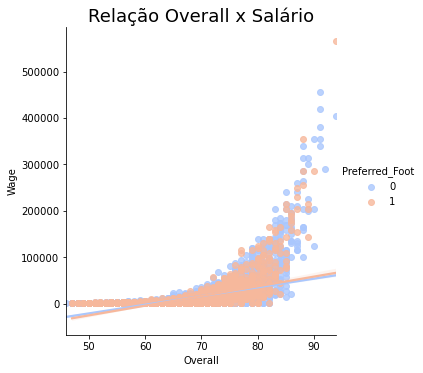

In [144]:
sns.lmplot(x='Overall', y= 'Wage', data = df1, hue ='Preferred_Foot', 
           palette='coolwarm', height=5)
plt.title('Relação Overall x Salário', size=18);

# Regressão Linear

In [204]:
reg = linear_model.LinearRegression()
feature = "Overall"
X = df1.drop(feature, axis = 1)
y = df1[f"{feature}"]
reg.fit(X, y);

In [205]:
reg.score(X, y)

0.9365948365973505

### Analisando a importância das features

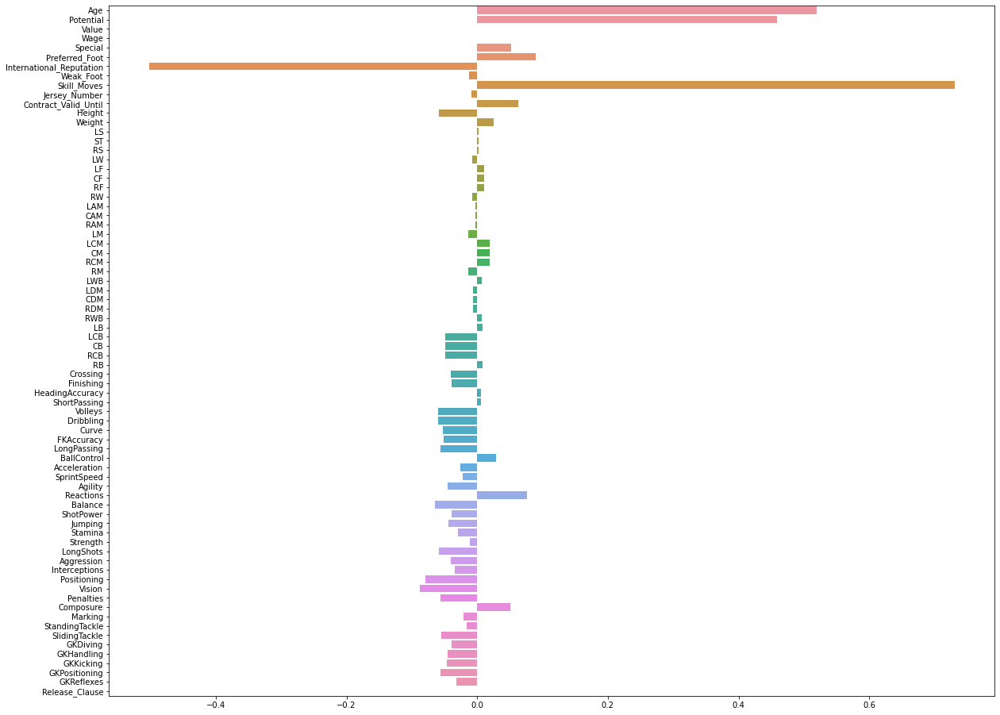

In [206]:
plt.figure(figsize=(20,16))
sns.barplot(y=X.columns, x=reg.coef_);

# Que viagem!!! 
# Quanto maior o valor do jogador meio que "menor" é a sua altura!!!!
# Change my mind

In [219]:
X_hab = df1[40:73]
y = df1.Overall

In [220]:
X_hab

,Age,Overall,Potential,Value,Wage,Special,Preferred_Foot,International_Reputation,Weak_Foot,Skill_Moves,Jersey_Number,Contract_Valid_Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
40,31,87,87,34000000.0,155000.0,2079,1,3.0,3.0,3.0,5.0,2019,1.88,86.0,69,69,69,68,69,69,69,68,70,70,70,70,74,74,74,70,79,81,81,81,79,80,84,84,84,80
41,30,87,87,46500000.0,125000.0,2188,0,3.0,5.0,3.0,17.0,2020,1.83,79.0,81,81,81,82,83,83,83,82,84,84,84,82,84,84,84,82,77,78,78,78,77,75,72,72,72,75
42,30,87,87,46500000.0,260000.0,2184,0,4.0,3.0,3.0,4.0,2021,1.83,78.0,77,77,77,80,81,81,81,80,82,82,82,81,84,84,84,81,77,79,79,79,77,75,70,70,70,75
43,31,87,87,34000000.0,240000.0,1950,0,4.0,3.0,2.0,3.0,2022,1.93,85.0,68,68,68,64,66,66,66,64,67,67,67,66,73,73,73,66,75,81,81,81,75,77,83,83,83,77
44,22,86,92,61000000.0,195000.0,2090,1,2.0,3.0,4.0,19.0,2021,1.83,75.0,82,82,82,84,84,84,84,84,82,82,82,83,74,74,74,83,65,59,59,59,65,61,52,52,52,61
45,23,86,91,59500000.0,180000.0,2039,1,2.0,3.0,4.0,11.0,2022,1.73,64.0,75,75,75,84,82,82,82,84,84,84,84,84,80,80,80,84,68,65,65,65,68,63,53,53,53,63
46,26,86,87,52000000.0,195000.0,2110,0,3.0,4.0,4.0,10.0,2023,1.75,69.0,81,81,81,84,84,84,84,84,83,83,83,83,77,77,77,83,66,63,63,63,66,62,55,55,55,62
47,26,86,88,44500000.0,165000.0,2046,0,3.0,3.0,2.0,4.0,2023,1.93,92.0,68,68,68,65,66,66,66,65,67,67,67,67,71,71,71,67,76,80,80,80,76,78,85,85,85,78
48,23,86,89,56500000.0,195000.0,2036,0,3.0,3.0,4.0,10.0,2023,1.70,69.0,76,76,76,84,83,83,83,84,83,83,83,84,77,77,77,84,69,63,63,63,69,66,52,52,52,66
49,26,86,87,53000000.0,195000.0,2187,0,3.0,4.0,4.0,9.0,2023,1.80,76.0,83,83,83,83,84,84,84,83,84,84,84,83,82,82,82,83,72,73,73,73,72,69,67,67,67,69


In [217]:
reg_hab = linear_model.LinearRegression()
reg_hab.fit(X_hab, y);

ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [208]:
# Selecionando as features para o modelo

X_imp = df1[["Age", "Potential", "Special", "Preferred_Foot", "International_Reputation", "Skill_Moves", "Reactions"]]
y = df1.Overall

reg_imp = linear_model.LinearRegression()
reg_imp.fit(X_imp, y);

In [236]:
print("Score: ", reg_imp.score(X_imp, y),
"\n\nCoeficientes: ", reg_imp.coef_,
"\n\nIntercept: ", reg_imp.intercept_)

Score:  0.9035790220348232 

Coeficientes:  [0.62458696 0.61231825 0.00588973 0.00614922 0.12714644 0.35264347
 0.18311261] 

Intercept:  -15.215571378630358


In [223]:
X_train, X_test, y_train, y_test = train_test_split(X_imp,y, test_size=0.4, random_state = 123)

In [225]:
a = 5245
pred = reg_imp.predict(X_test)
print("Predito: ", round(reg_imp.predict([X_test.iloc[a]])[0], 0), "\nReal: ", df1.Overall[a])

Predito:  68.0 
Real:  69


# .................................................

In [233]:
print('Coefficients: \n', reg_imp.coef_)
# The mean squared error
print('Mean squared error: %.2f', mean_squared_error(y_test, pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'
      % r2_score(y_test, pred))

# Plot outputs
plt.scatter(X_test, y_test,  color='black')
plt.plot(X_test, pred, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

Coefficients: 
 [0.62458696 0.61231825 0.00588973 0.00614922 0.12714644 0.35264347
 0.18311261]


NameError: name 'mean_squared_error' is not defined

# ........................................................

# Últimos quadrados

In [168]:
import numpy as np
import statsmodels.api as sm
from sklearn.preprocessing import RobustScaler

In [190]:
X_imp

,Age,Potential,Special,Preferred_Foot,International_Reputation,Skill_Moves,Reactions
0,31,94,2202,1,5.0,4.0,95.0
1,33,94,2228,0,5.0,5.0,96.0
2,26,93,2143,0,5.0,5.0,94.0
3,27,92,2281,0,4.0,4.0,91.0
4,27,91,2142,0,4.0,4.0,90.0
...,...,...,...,...,...,...,...
14738,19,65,1307,0,1.0,2.0,49.0
14739,19,63,1098,0,1.0,2.0,40.0
14740,16,67,1189,0,1.0,2.0,47.0
14741,17,66,1228,0,1.0,2.0,21.0


In [187]:
model = sm.OLS(y, X_imp)

In [188]:
results = model.fit()

In [189]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                Overall   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          1.747e+06
Date:                Mon, 07 Dec 2020   Prob (F-statistic):                        0.00
Time:                        09:09:39   Log-Likelihood:                         -33298.
No. Observations:               14743   AIC:                                  6.661e+04
Df Residuals:                   14736   BIC:                                  6.666e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Age                          0.4232      0.005     86.217      0.000       0.414       0.433
Potential                    0.4049      0.003    151.175      0.000       0.400       0.410
Special                      0.0054      0.000     31.190      0.000       0.005       0.006
Preferred_Foot               0.0124      0.045      0.278      0.781      -0.075       0.100
International_Reputation     0.8917      0.054     16.596      0.000       0.786       0.997
Skill_Moves                  0.5703      0.039     14.660      0.000       0.494       0.647
Reactions                    0.2503      0.004     67.775      0.000       0.243       0.258
==============================================================================
Omnibus:                      420.919   Durbin-Watson:                   1.300
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              476.090
Skew:                          -0.390   Prob(JB):                    4.15e-104
Kurtosis:                       3.407   Cond. No.                     4.75e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.75e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

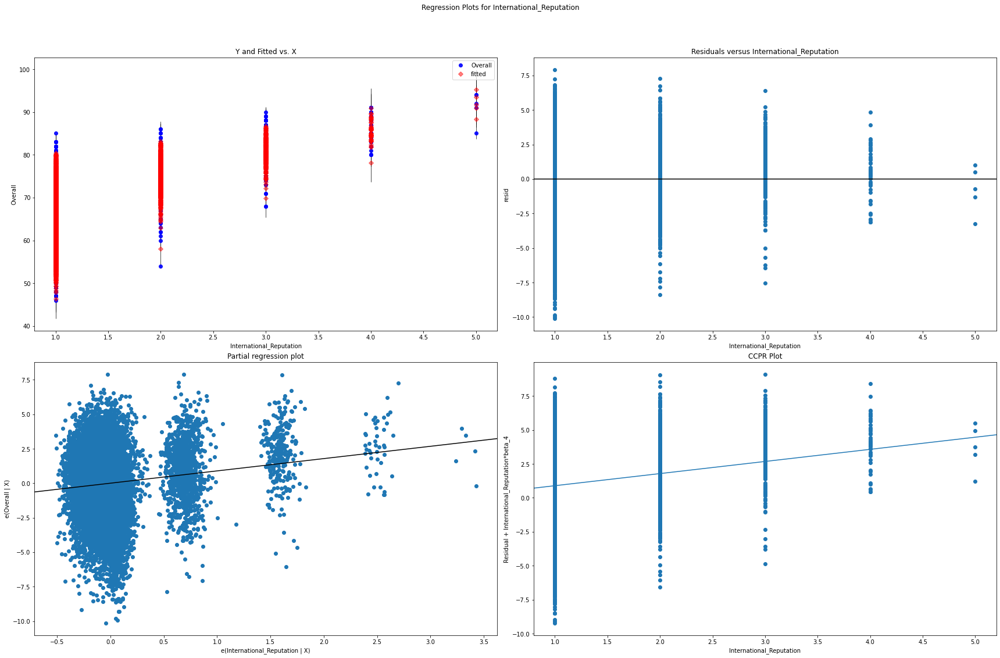

In [193]:
#define figure size
fig = plt.figure(figsize=(24,16))

#produce regression plots
fig = sm.graphics.plot_regress_exog(results, 'International_Reputation', fig=fig)